In [1]:
# Install the required libraries
#SAM
!pip install git+https://github.com/facebookresearch/segment-anything.git
#Transformers
!pip install -q git+https://github.com/huggingface/transformers.git
#Datasets to prepare data and monai if you want to use special loss functions
!pip install datasets
!pip install -q monai
#Patchify to divide large images into smaller patches for training. (Not necessary for smaller images)
!pip install patchify

  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-6q76b_y9
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-6q76b_y9
  Resolved https://github.com/facebookresearch/segment-anything.git to commit 6fdee8f2727f4506cfbbe553e23b895e27956588
  Preparing metadata (setup.py) ... done


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import tifffile
import os
from patchify import patchify  #Only to handle large images
import random
from scipy import ndimage
import cv2
from datasets import Dataset
from PIL import Image
import matplotlib.pyplot as plt
import random
import torch

In [3]:
# Đường dẫn tới thư mục chứa các hình ảnh
image_folder = "/kaggle/input/otu-2d/OTU_2D/test/Image"

# Lấy danh sách các tệp trong thư mục và sắp xếp theo thứ tự tên tăng dần từ A đến Z
image_files = sorted(os.listdir(image_folder))

# Khởi tạo một danh sách để chứa các hình ảnh dưới dạng mảng NumPy
image_array_list = []

# Lặp qua tất cả các tệp trong thư mục đã sắp xếp
for filename in image_files:
    # Kiểm tra xem tệp có phải là hình ảnh không
    if filename.endswith(('.JPG')):
        # Đường dẫn đầy đủ tới hình ảnh
        img_path = os.path.join(image_folder, filename)

        # Đọc hình ảnh
        img = cv2.imread(img_path, cv2.IMREAD_COLOR)
        img = cv2.resize(img, (256, 256))

        # Kiểm tra xem hình ảnh có được đọc thành công hay không
        if img is not None:
            # Thêm hình ảnh vào danh sách
            image_array_list.append(img)
        else:
            print(f"Không thể đọc hình ảnh {filename}")

# Chuyển đổi danh sách hình ảnh thành mảng NumPy
test_images_np = np.array(image_array_list)

# In ra kích thước của mảng hình ảnh
print("Kích thước của mảng hình ảnh:", test_images_np.shape)

Kích thước của mảng hình ảnh: (146, 256, 256, 3)


In [4]:
# Đường dẫn tới thư mục chứa các hình ảnh
image_folder = "/kaggle/input/otu-2d/OTU_2D/test/Label"

# Lấy danh sách các tệp trong thư mục và sắp xếp theo thứ tự tên tăng dần từ A đến Z
image_files = sorted(os.listdir(image_folder))

# Khởi tạo một danh sách để chứa các hình ảnh dưới dạng mảng NumPy
image_array_list = []

# Lặp qua tất cả các tệp trong thư mục đã được sắp xếp
for filename in image_files:
    # Kiểm tra xem tệp có phải là hình ảnh không
    if filename.endswith('.PNG'):
        # Đường dẫn đầy đủ tới hình ảnh
        img_path = os.path.join(image_folder, filename)

        # Đọc hình ảnh
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, (256, 256))
        img = img / 255.0
        (thresh, img) = cv2.threshold(img, 0, 1, cv2.THRESH_BINARY)

        # img = np.int32(img)

        # Kiểm tra xem hình ảnh có được đọc thành công hay không
        if img is not None:
            # Thêm hình ảnh vào danh sách
            image_array_list.append(img)
        else:
            print(f"Không thể đọc hình ảnh {filename}")

# Chuyển đổi danh sách hình ảnh thành mảng NumPy
test_labels_np = np.array(image_array_list)

# In ra kích thước của mảng hình ảnh
print("Kích thước của mảng mặt nạ:", test_labels_np.shape)

Kích thước của mảng mặt nạ: (146, 256, 256)


In [5]:
# Convert the NumPy arrays to Pillow images and store them in a dictionary
dataset_dict = {
    "image": [Image.fromarray(img).convert('RGB') for img in test_images_np],
    "label": [Image.fromarray(mask).convert('I') for mask in test_labels_np],
}

# Create the dataset using the datasets.Dataset class
test_dataset = Dataset.from_dict(dataset_dict)

In [6]:
test_dataset

Dataset({
    features: ['image', 'label'],
    num_rows: 146
})

In [7]:
#Get bounding boxes from mask.
def get_bounding_box(ground_truth_map):
  # get bounding box from mask
  y_indices, x_indices = np.where(ground_truth_map > 0)
  x_min, x_max = np.min(x_indices), np.max(x_indices)
  y_min, y_max = np.min(y_indices), np.max(y_indices)
  # add perturbation to bounding box coordinates
  H, W = ground_truth_map.shape
  x_min = max(0, x_min - np.random.randint(0, 20))
  x_max = min(W, x_max + np.random.randint(0, 20))
  y_min = max(0, y_min - np.random.randint(0, 20))
  y_max = min(H, y_max + np.random.randint(0, 20))
  bbox = [x_min, y_min, x_max, y_max]

  return bbox

# In hình ảnh 

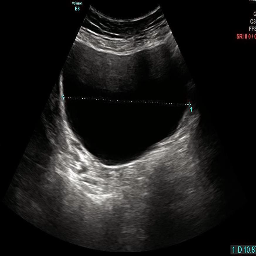

In [8]:
import numpy as np
from PIL import Image

# let's take a random training example
idx = 100

# load image
image = test_dataset[idx]["image"]
image

In [9]:
from transformers import SamProcessor
processor_MedSAM = SamProcessor.from_pretrained("wanglab/medsam-vit-base")
processor_SAM = SamProcessor.from_pretrained("facebook/sam-vit-base")

processor_MedSAM_DiceCE = SamProcessor.from_pretrained("wanglab/medsam-vit-base")
processor_SAM_DiceCE = SamProcessor.from_pretrained("facebook/sam-vit-base")

2024-04-25 03:40:23.432633: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-25 03:40:23.432727: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-25 03:40:23.559517: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


preprocessor_config.json:   0%|          | 0.00/466 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/466 [00:00<?, ?B/s]

In [10]:
# Sử dụng GPU nếu có sẵn
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [11]:
from transformers import SamModel, SamConfig

#------------------JointLoss------------------------
model_SAM = SamConfig.from_pretrained("facebook/sam-vit-base")
# Create an instance of the model architecture with the loaded configuration
my_modelSAM = SamModel(config=model_SAM)
#Update the model by loading the weights from saved file.
my_modelSAM.load_state_dict(torch.load("/kaggle/input/jointloss-sam-dataset/checkpoint_SAM/best_model_weights_SAM_jointloss.pt"))
    
model_MedSAM = SamConfig.from_pretrained("wanglab/medsam-vit-base")
my_modelMedSAM = SamModel(config=model_MedSAM)
#Update the model by loading the weights from saved file.
my_modelMedSAM.load_state_dict(torch.load("/kaggle/input/jointloss-medsam-dataset/checkpoint_SAM/best_model_weights_MedSAM_jointLoss.pt"))


#------------------DiceCELoss-----------------------
model_SAM_DiceCE = SamConfig.from_pretrained("facebook/sam-vit-base")
# Create an instance of the model architecture with the loaded configuration
my_modelSAM_DiceCE = SamModel(config=model_SAM_DiceCE)
#Update the model by loading the weights from saved file.
my_modelSAM_DiceCE.load_state_dict(torch.load("/kaggle/input/validation-100epochs/checkpoint_SAM/best_model_weights.pt"))

model_MedSAM_DiceCE = SamConfig.from_pretrained("wanglab/medsam-vit-base")
my_modelMedSAM_DiceCE = SamModel(config=model_MedSAM_DiceCE)
#Update the model by loading the weights from saved file.
my_modelMedSAM_DiceCE.load_state_dict(torch.load("/kaggle/input/medsam-final/checkpoint_SAM/best_model_weights_MedSAM.pt"))

config.json:   0%|          | 0.00/6.57k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/6.52k [00:00<?, ?B/s]

<All keys matched successfully>

In [12]:
# set the device to cuda if available, otherwise use cpu
device = "cuda" if torch.cuda.is_available() else "cpu"
my_modelSAM.to(device)

my_modelMedSAM.to(device)

my_modelSAM_DiceCE.to(device)

my_modelMedSAM_DiceCE.to(device)

SamModel(
  (shared_image_embedding): SamPositionalEmbedding()
  (vision_encoder): SamVisionEncoder(
    (patch_embed): SamPatchEmbeddings(
      (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    )
    (layers): ModuleList(
      (0-11): 12 x SamVisionLayer(
        (layer_norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (attn): SamVisionAttention(
          (qkv): Linear(in_features=768, out_features=2304, bias=True)
          (proj): Linear(in_features=768, out_features=768, bias=True)
        )
        (layer_norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): SamMLPBlock(
          (lin1): Linear(in_features=768, out_features=3072, bias=True)
          (lin2): Linear(in_features=3072, out_features=768, bias=True)
          (act): GELUActivation()
        )
      )
    )
    (neck): SamVisionNeck(
      (conv1): Conv2d(768, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (layer_norm1): SamLayerNorm()
     

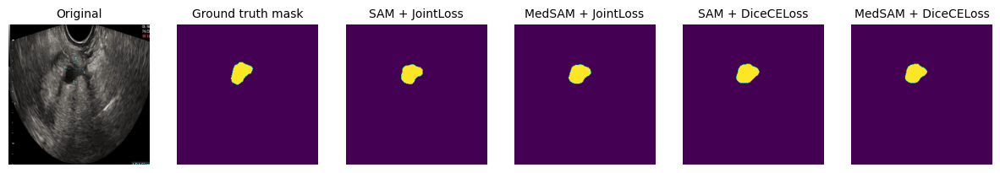

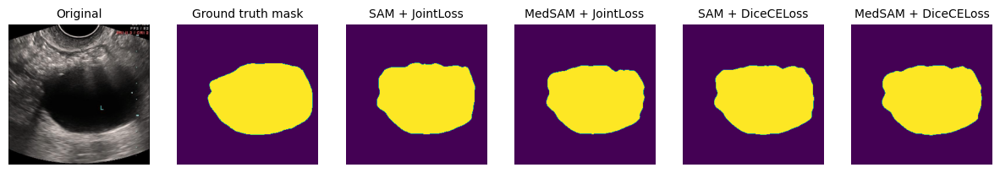

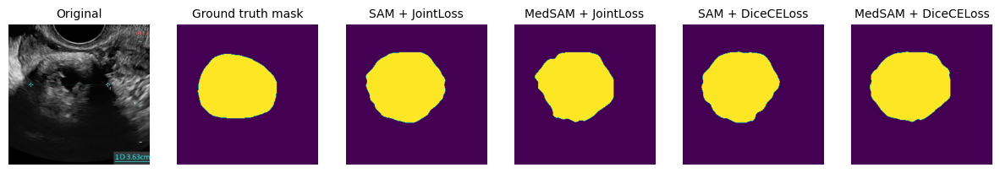

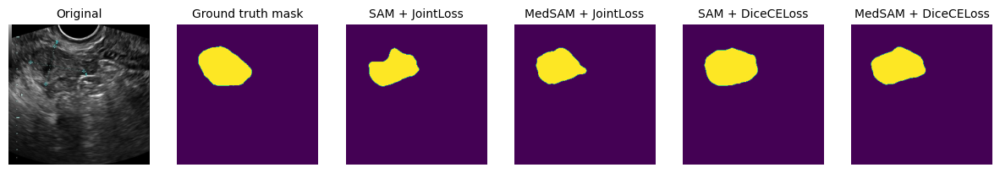

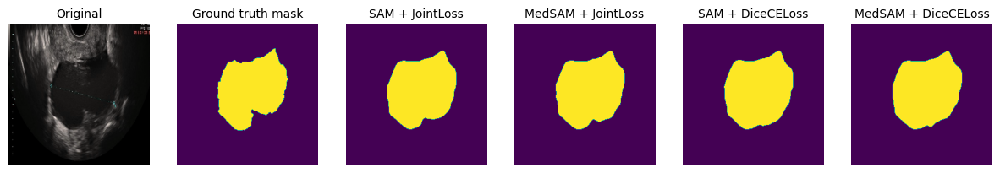

...

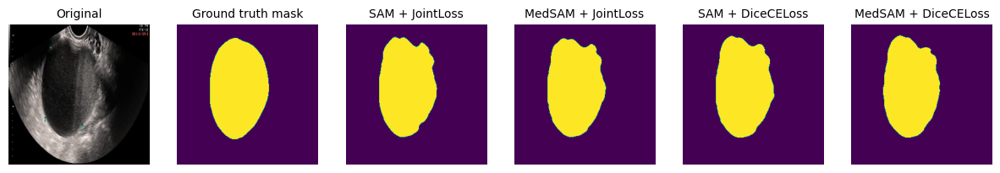

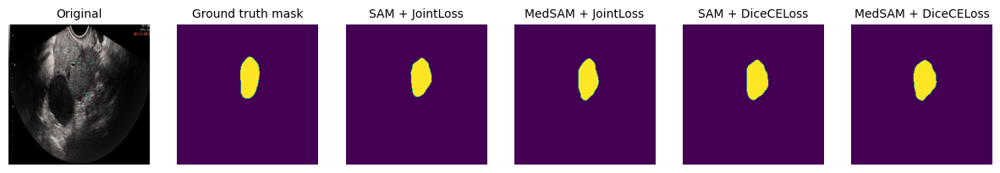

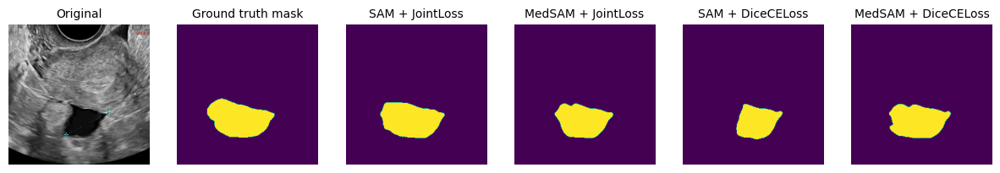

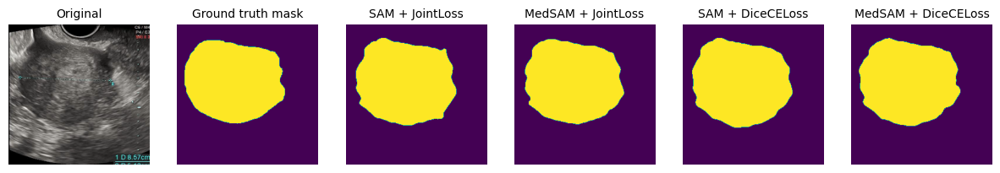

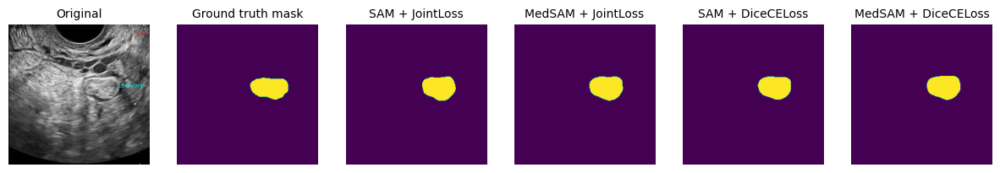

In [13]:
import cv2
import numpy as np
from PIL import Image
import torch
import matplotlib.pyplot as plt

# Sử dụng GPU nếu có sẵn
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

for idx in range(0, len(test_dataset)):  # Duyệt qua các chỉ số từ 1 đến len data
    # load image
    image = test_dataset[idx]["image"]

    # get box prompt based on ground truth segmentation map
    ground_truth_mask = np.array(test_dataset[idx]["label"])
    prompt = get_bounding_box(ground_truth_mask)

    # prepare image + box prompt for the model
    inputs_SAM = processor_SAM(image, input_boxes=[[prompt]], return_tensors="pt").to(device)
    inputs_MedSAM = processor_MedSAM(image, input_boxes=[[prompt]], return_tensors="pt").to(device)
    
    inputs_SAM_DiceCE = processor_SAM_DiceCE(image, input_boxes=[[prompt]], return_tensors="pt").to(device)
    inputs_MedSAM_DiceCE = processor_MedSAM_DiceCE(image, input_boxes=[[prompt]], return_tensors="pt").to(device)
    
#     model_SAM.eval()
#     model_MedSAM.eval()
    
    #---------------------------------------------------------------------
    #SAM
    # forward pass
    with torch.no_grad():
        outputs_SAM = my_modelSAM(**inputs_SAM, multimask_output=False)
        outputs_MedSAM = my_modelMedSAM(**inputs_MedSAM, multimask_output=False)
        
        outputs_SAM_DiceCE = my_modelSAM_DiceCE(**inputs_SAM_DiceCE, multimask_output=False)
        outputs_MedSAM_DiceCE = my_modelMedSAM_DiceCE(**inputs_SAM_DiceCE, multimask_output=False)
    
        # SAM + jointLoss
        # apply sigmoid
        sam_seg_prob = torch.sigmoid(outputs_SAM.pred_masks.squeeze(1))
        # convert soft mask to hard mask
        sam_seg_prob = sam_seg_prob.cpu().numpy().squeeze()
        sam_seg = (sam_seg_prob > 0.5).astype(np.uint8)
        sam_seg = cv2.medianBlur(sam_seg, 7)
        sam_seg = cv2.medianBlur(sam_seg, 7)
        
        # MedSAM + jointLoss
        # apply sigmoid
        medsam_seg_prob = torch.sigmoid(outputs_MedSAM.pred_masks.squeeze(1))
        # convert soft mask to hard mask
        medsam_seg_prob = medsam_seg_prob.cpu().numpy().squeeze()
        medsam_seg = (medsam_seg_prob > 0.5).astype(np.uint8)
        medsam_seg = cv2.medianBlur(medsam_seg, 7)
        medsam_seg = cv2.medianBlur(medsam_seg, 7)
        
        # SAM + DiceCELoss
        # apply sigmoid
        sam_seg_prob_diceCE = torch.sigmoid(outputs_SAM_DiceCE.pred_masks.squeeze(1))
        # convert soft mask to hard mask
        sam_seg_prob_diceCE = sam_seg_prob_diceCE.cpu().numpy().squeeze()
        sam_seg_diceCE = (sam_seg_prob_diceCE > 0.5).astype(np.uint8)
        sam_seg_diceCE = cv2.medianBlur(sam_seg_diceCE, 7)
        sam_seg_diceCE = cv2.medianBlur(sam_seg_diceCE, 7)
        
        # MedSAM + DiceCELoss
        # apply sigmoid
        medsam_seg_prob_diceCE = torch.sigmoid(outputs_MedSAM_DiceCE.pred_masks.squeeze(1))
        # convert soft mask to hard mask
        medsam_seg_prob_diceCE = medsam_seg_prob_diceCE.cpu().numpy().squeeze()
        medsam_seg_diceCE = (medsam_seg_prob_diceCE > 0.5).astype(np.uint8)
        medsam_seg_diceCE = cv2.medianBlur(medsam_seg_diceCE, 7)
        medsam_seg_diceCE = cv2.medianBlur(medsam_seg_diceCE, 7)
        
        

    fig, axes = plt.subplots(1, 6, figsize=(15, 5))
    # Hiển thị hình ảnh
    axes[0].imshow(image)
    axes[0].set_title("Original", fontsize=10)
    axes[0].axis("off")

    # Hiển thị đồ thị cho ground truth mask
    axes[1].imshow(ground_truth_mask)
    axes[1].set_title("Ground truth mask", fontsize=10)
    axes[1].axis("off")

    # Hiển thị đồ thị cho predicted mask
    axes[2].imshow(sam_seg)
    axes[2].set_title("SAM + JointLoss", fontsize=10)
    axes[2].axis("off")

    axes[3].imshow(medsam_seg)
    axes[3].set_title("MedSAM + JointLoss", fontsize=10)
    axes[3].axis("off")
    
    # Hiển thị đồ thị cho predicted mask
    axes[4].imshow(sam_seg_diceCE)
    axes[4].set_title("SAM + DiceCELoss", fontsize=10)
    axes[4].axis("off")

    axes[5].imshow(medsam_seg_diceCE)
    axes[5].set_title("MedSAM + DiceCELoss", fontsize=10)
    axes[5].axis("off")
    plt.show()